**Overview**

The following method works the best so far

1. Load target image - keep colored
2. Run bilateral filter on image (denoise)
3. Run Canny edge detection
4. Dilate edges
5. Erode Edges
6. Remove Small Pieces
7. Dilate Edges (again)
8. Remove Small Pieces (again)
9. Erode Edges (again)
10. Invert
11. Segment (https://bi1.caltech.edu/code/t04_quantitative_image_processing.html)

**Edge Detection Canny**

This code detects edges and removes "extra noise" from it.

**Goal:** use edge detection and denoising software to extract individual crystals from a thin section macro mosaic (segmentation)

For all segmentation attempts, we use the Canny edge detection method with the "optimal" thresholds

In [ ]:
# Importing Library
import cv2 as cv2
import numpy as np
import matplotlib.pyplot as plt
import skimage
from skimage import measure
from skimage import io
from PIL import Image
from skimage import segmentation

**Method 1**
1. Load image
2. Bilateral Filter
3. Edge detection using optimized thresholds
4. Dilate
5. Erode
6. Dilate Again
7. Remove small
8. Invert
9. Segment

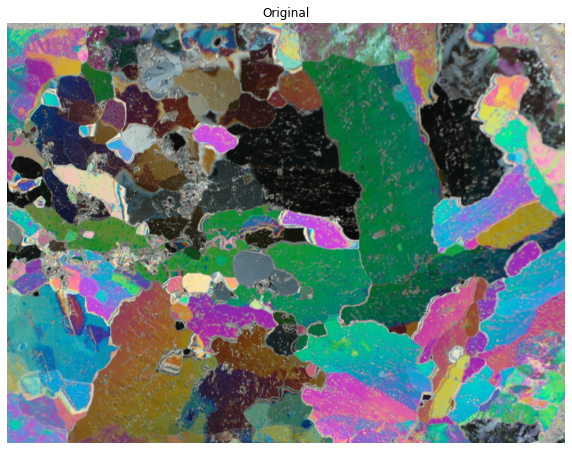

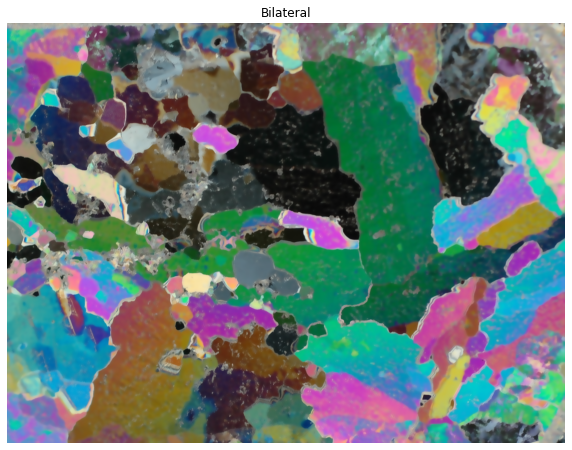

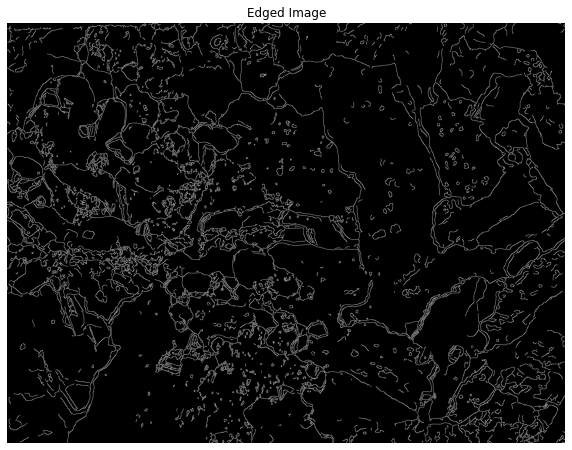

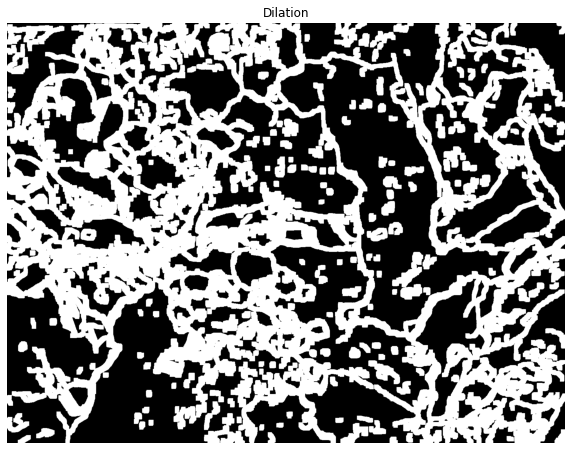

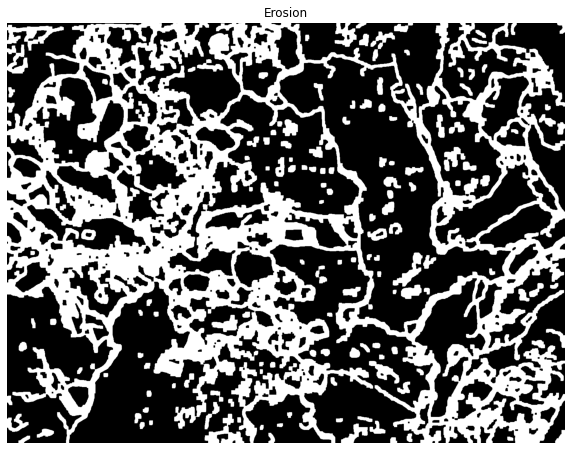

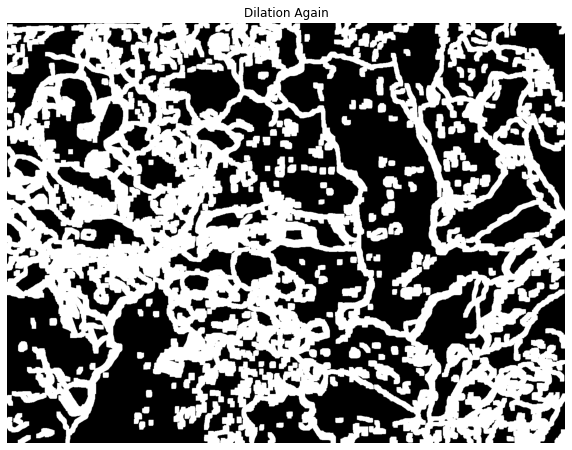

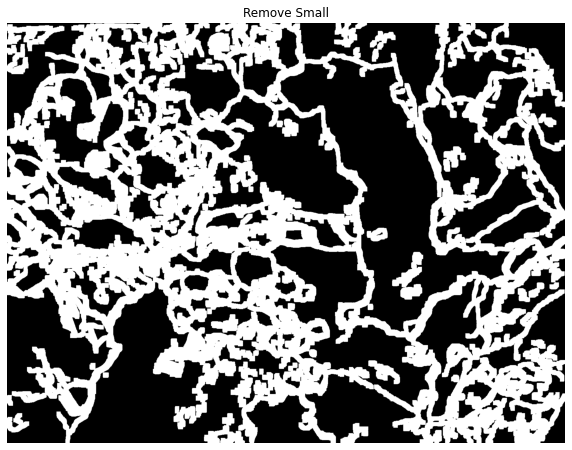

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:85: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


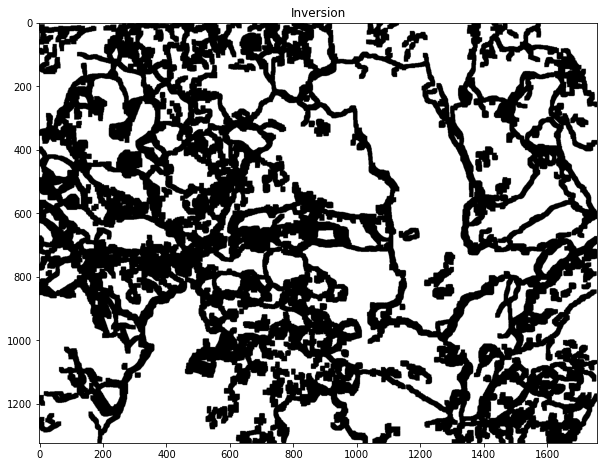

number of objects: 385


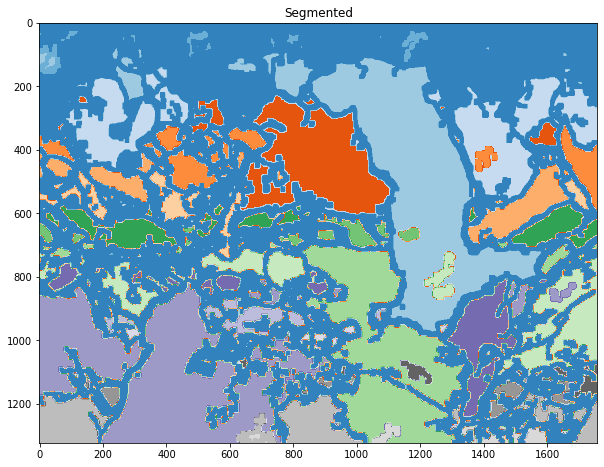

In [ ]:
# loading original/target image
loaded_image = cv2.imread("croppedMacro.jpg")
loaded_image = cv2.cvtColor(loaded_image,cv2.COLOR_BGR2RGB)

# plotting loaded image
plt.figure(figsize=(10,10))
plt.imshow(loaded_image,cmap="gray")
plt.title("Original")
plt.axis("off")
plt.show()

# Edge Detection using bilateral filter 
bilateral = cv2.bilateralFilter(loaded_image, 15, 75, 75)

# Edge detection using Canny
v = np.median(bilateral)
sigma = 0.33
lowerThresh = int(max(0, (1.0 - sigma)*v))
upperThresh = int(min(255, (1.0 + sigma)*v))

# plotting bilateral
plt.figure(figsize=(10,10))
plt.imshow(bilateral,cmap="gray")
plt.title("Bilateral")
plt.axis("off")
plt.show()

edged_image = cv2.Canny(bilateral, lowerThresh, upperThresh)
# plotting edged
plt.figure(figsize=(10,10))
plt.imshow(edged_image,cmap="gray")
plt.title("Edged Image")
plt.axis("off")
plt.show()

kernel = np.ones((5,5),np.uint8)
dilation = cv2.dilate(edged_image, kernel, iterations = 3)
# plotting first dilation
plt.figure(figsize=(10,10))
plt.imshow(dilation,cmap="gray")
plt.title("Dilation")
plt.axis("off")
plt.show()

erosion = cv2.erode(dilation,kernel,iterations = 1)
# plotting erosion
plt.figure(figsize=(10,10))
plt.imshow(erosion,cmap="gray")
plt.title("Erosion")
plt.axis("off")
plt.show()

dilation2 = cv2.dilate(erosion, kernel, iterations = 1)
# plotting second dilation
plt.figure(figsize=(10,10))
plt.imshow(dilation2,cmap="gray")
plt.title("Dilation Again")
plt.axis("off")
plt.show()

# removing small pieces 
connectivity = 4  # You need to choose 4 or 8 for connectivity type
nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(dilation2, connectivity , cv2.CV_32S)
sizes = stats[1:, -1]; nb_components = nb_components - 1
# minimum size of particles we want to keep (number of pixels)
# here it's a fixed value, but you can set it as you want, eg the mean of the sizes or whatever
min_size = 2000
# removeSmall 
removeSmall = np.zeros((output.shape))
# for every component in the image, you keep it only if it's above min_size
for i in range(0, nb_components):
    if sizes[i] >= min_size:
        removeSmall[output == i + 1] = 255

# plotting removeSmall
plt.figure(figsize=(10,10))
plt.imshow(removeSmall,cmap="gray")
plt.title("Remove Small")
plt.axis("off")
plt.show()

# Segmentation using skimage.measure, on inverted image
# plotting inversion
plt.figure(figsize=(10,10))
inverted = np.invert(removeSmall.astype(np.int))
plt.imshow(inverted,cmap='gray')
plt.title("Inversion")
plt.show()

# segmentation example: https://bi1.caltech.edu/code/t04_quantitative_image_processing.html 
im_lab,num_obj = skimage.measure.label(inverted,return_num = True) 
print('number of objects: ' +str(num_obj))

# plotting segmented pieces
plt.figure(figsize=(10,10))
rainbow = plt.cm.tab20c
plt.imshow(im_lab,cmap=rainbow)
plt.title("Segmented")
plt.show()
#plt.colorbar()

regions = skimage.measure.regionprops(im_lab)

areas = []
majoraxis = []
for props in regions:
    #print(props['area'])
    if props['area'] > 1000: #exclude smallest regions
        areas.append(props['area'])
        majoraxis.append(props['major_axis_length'])
    #area.append(props['area'])
    #props.area


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


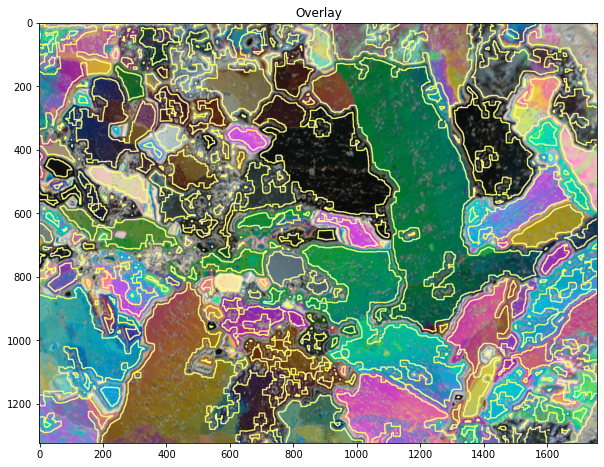

In [ ]:
plt.rcParams["lines.linewidth"] = 6
result_image = segmentation.mark_boundaries(loaded_image, inverted, outline_color=[3,3,3],mode='thick')
# outline color choices: https://developer.rhino3d.com/guides/rhinopython/python-rhinoscriptsyntax-color/
plt.figure(figsize=(10,10))
plt.title("Overlay")
plt.imshow(result_image)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


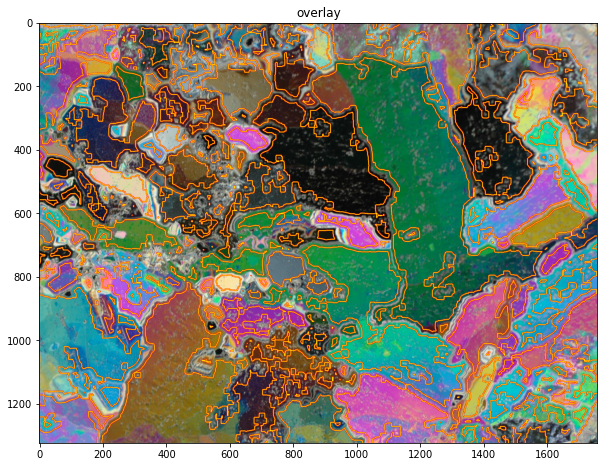

In [ ]:
plt.rcParams["lines.linewidth"] = 6
result_image = segmentation.mark_boundaries(loaded_image, inverted, outline_color=[4,0,0],mode='thick')
plt.figure(figsize=(10,10))
plt.title("overlay")
plt.imshow(result_image)

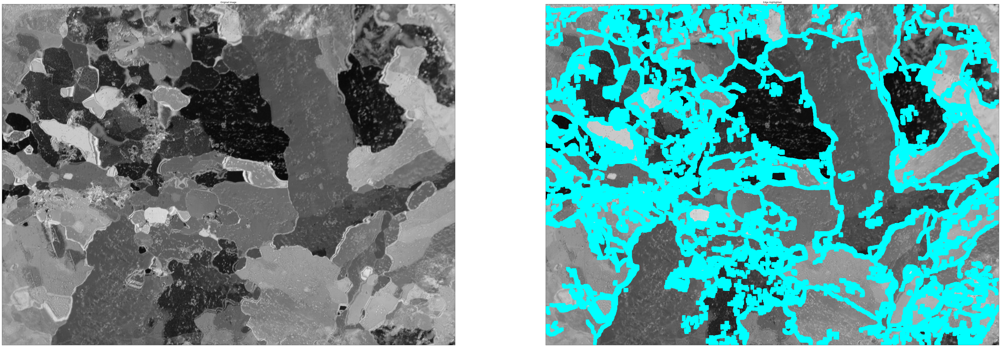

In [ ]:
# Another method
# overlaying image with only borders on top of original

# converting image to grayscale
gray_image = cv2.cvtColor(loaded_image,cv2.COLOR_BGR2GRAY)

img = cv2.merge((gray_image,gray_image,gray_image))  # creat RGB image from grayscale
img2 = img.copy()
img2[removeSmall == 255] = [0, 255, 255]  # turn edges to red

plt.figure(figsize=(100,100))
plt.subplot(121),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(img2)
plt.title('Edge Highlighted'), plt.xticks([]), plt.yticks([])

plt.show()

In [ ]:
areas = np.array(areas)
areas = areas[areas<.5e6]

(array([65.,  5.,  5.,  6.,  0.,  2.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,
         1.,  1.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([  1002,  11002,  21002,  31002,  41002,  51002,  61002,  71002,
         81002,  91002, 101002, 111002, 121002, 131002, 141002, 151002,
        161002, 171002, 181002, 191002, 201002, 211002]),
 <a list of 21 Patch objects>)

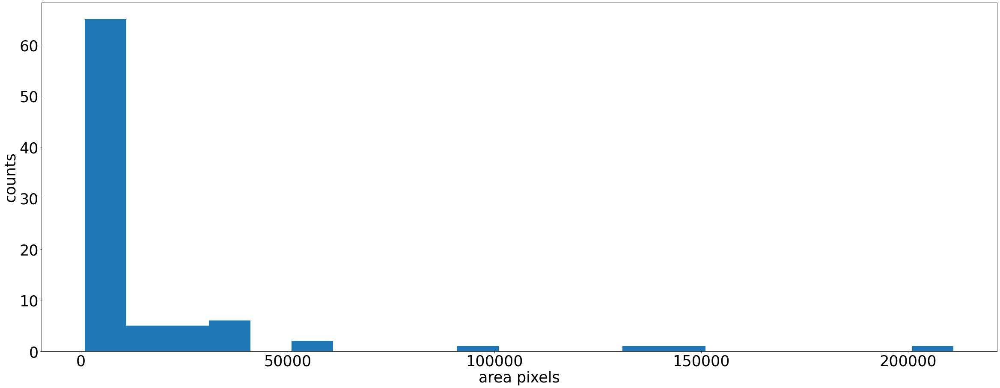

In [ ]:
plt.rcParams.update({'font.size':35})

plt.figure(figsize=(40,15))
#plt.xticks(fontsize=25)
#plt.yticks(fontsize=25)
plt.xlabel('area pixels')
plt.ylabel('counts')
# w is width of each bin in histogram
w = 10000
plt.hist(areas[areas<.5e6], bins=np.arange(min(areas), max(areas) + w, w))

**Method 2**
1. Load target image - keep colored
2. Run bilateral filter on image (denoise)
3. Run Canny edge detection
4. Dilate edges
5. Erode Edges
6. Remove Small Pieces
7. Dilate Edges (again)
8. Remove Small Pieces (again)
9. Erode Edges (again)
10. Invert
11. Segment (https://bi1.caltech.edu/code/t04_quantitative_image_processing.html)


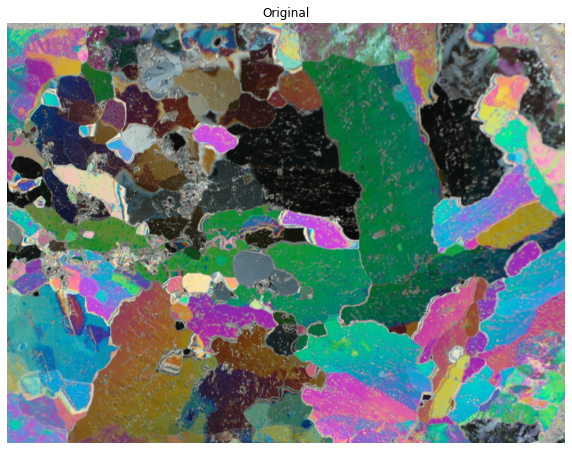

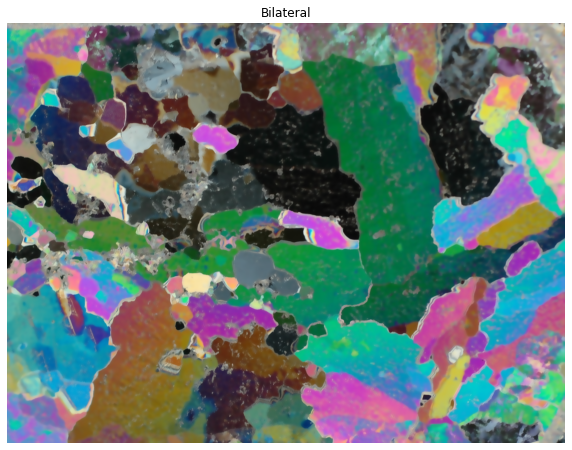

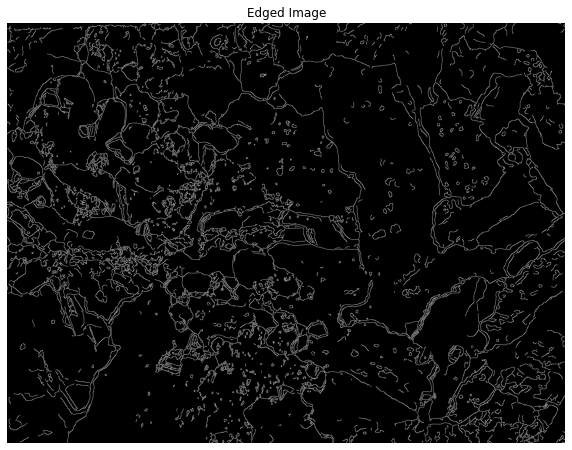

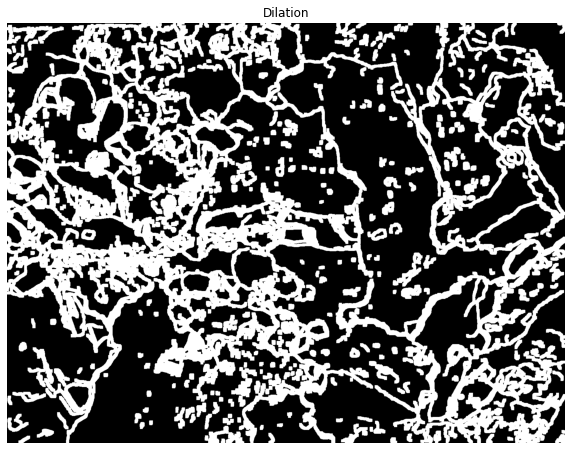

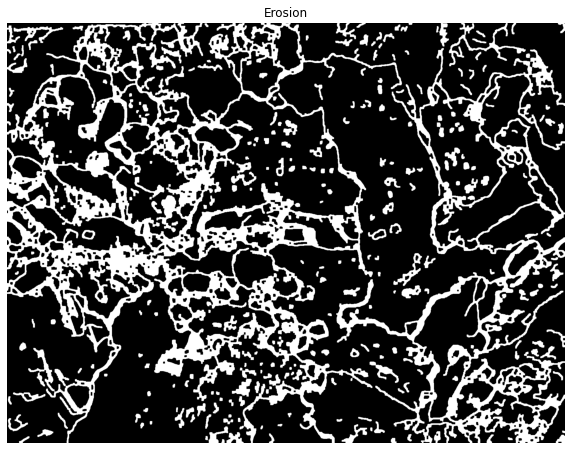

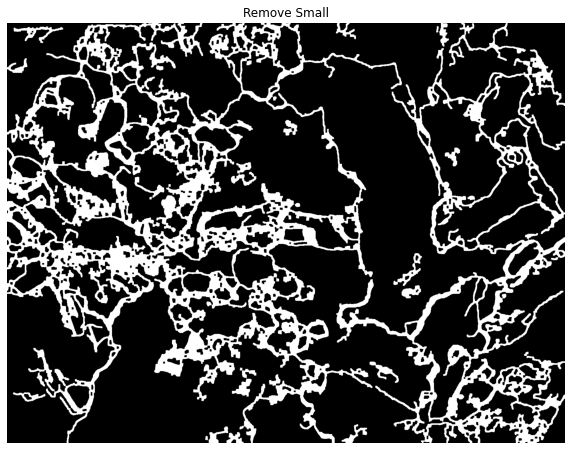

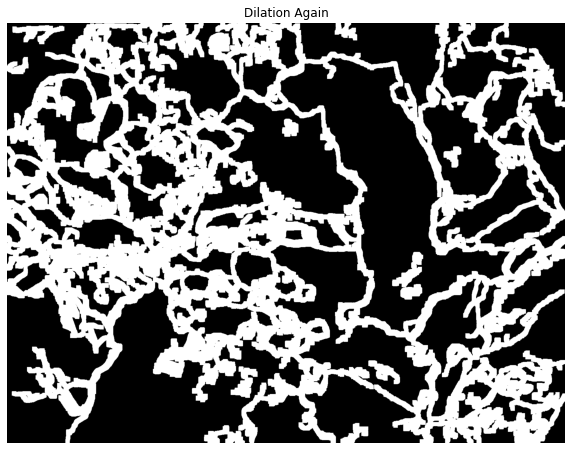

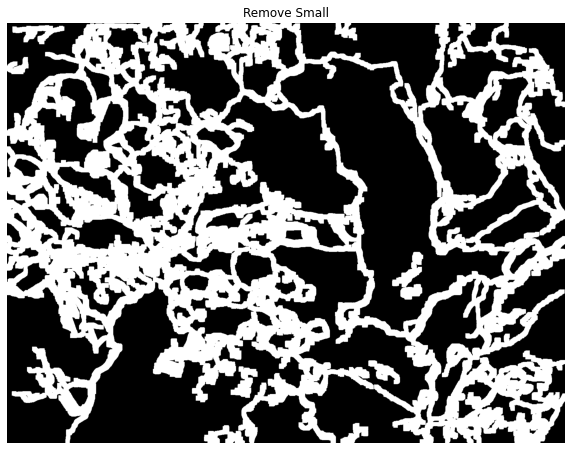

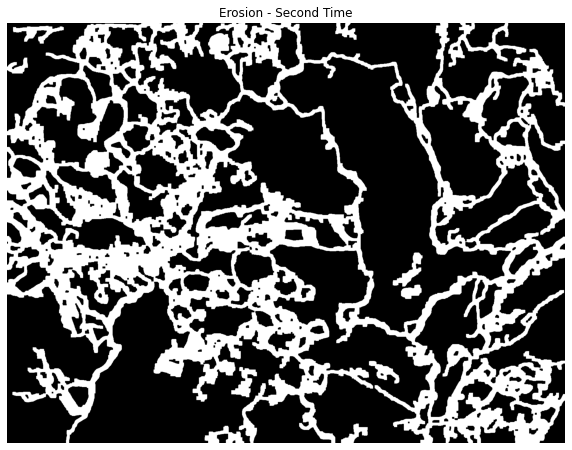

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:117: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


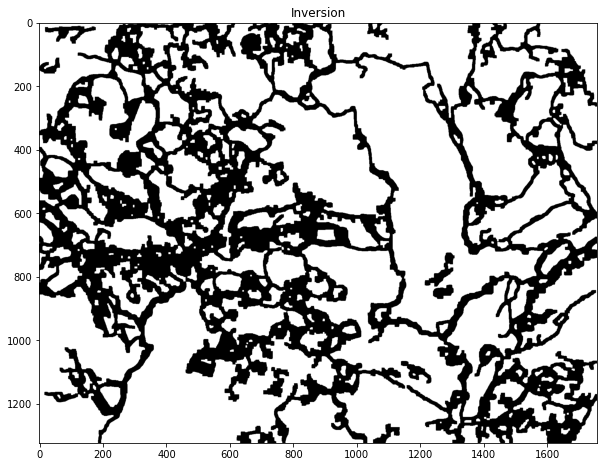

number of objects: 304


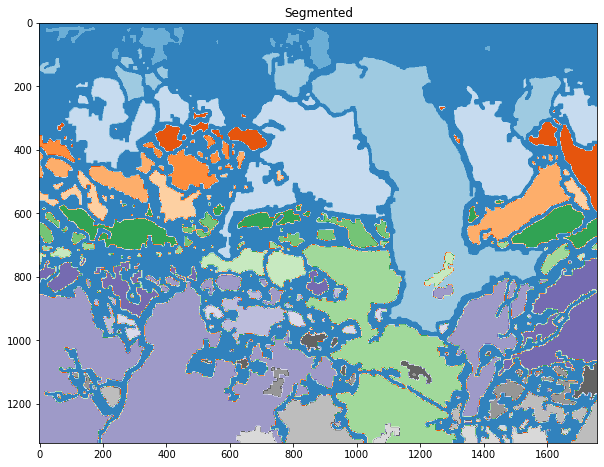

In [ ]:
# Attempt 2

# loading original/target image
loaded_image = cv2.imread("croppedMacro.jpg")
loaded_image = cv2.cvtColor(loaded_image,cv2.COLOR_BGR2RGB)

# plotting loaded image
plt.figure(figsize=(10,10))
plt.imshow(loaded_image,cmap="gray")
plt.title("Original")
plt.axis("off")
plt.show()

# Edge Detection using bilateral filter 
bilateral = cv2.bilateralFilter(loaded_image, 15, 75, 75)

# plotting bilateral
plt.figure(figsize=(10,10))
plt.imshow(bilateral,cmap="gray")
plt.title("Bilateral")
plt.axis("off")
plt.show()

# Edge detection using Canny
v = np.median(bilateral)
sigma = 0.33
lowerThresh = int(max(0, (1.0 - sigma)*v))
upperThresh = int(min(255, (1.0 + sigma)*v))

edged_image = cv2.Canny(bilateral, lowerThresh, upperThresh)
# plotting edged
plt.figure(figsize=(10,10))
plt.imshow(edged_image,cmap="gray")
plt.title("Edged Image")
plt.axis("off")
plt.show()

kernel = np.ones((5,5),np.uint8)
dilation = cv2.dilate(edged_image, kernel, iterations = 2)
# plotting first dilation
plt.figure(figsize=(10,10))
plt.imshow(dilation,cmap="gray")
plt.title("Dilation")
plt.axis("off")
plt.show()

erosion = cv2.erode(dilation,kernel,iterations = 1)
# plotting erosion
plt.figure(figsize=(10,10))
plt.imshow(erosion,cmap="gray")
plt.title("Erosion")
plt.axis("off")
plt.show()

# removing small pieces first time
connectivity = 4  # You need to choose 4 or 8 for connectivity type
nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(erosion, connectivity , cv2.CV_32S)
sizes = stats[1:, -1]; nb_components = nb_components - 1
# minimum size of particles we want to keep (number of pixels)
# here it's a fixed value, but you can set it as you want, eg the mean of the sizes
min_size = 1000
# removeSmall1
removeSmall1 = np.zeros((output.shape))
# for every component in the image, you keep it only if it's above min_size
for i in range(0, nb_components):
    if sizes[i] >= min_size:
        removeSmall1[output == i + 1] = 255

# plotting first remove small
plt.figure(figsize=(10,10))
plt.imshow(removeSmall1,cmap="gray")
plt.title("Remove Small")
plt.axis("off")
plt.show()

dilation2 = cv2.dilate(removeSmall1, kernel, iterations = 2)
# plotting second dilation
plt.figure(figsize=(10,10))
plt.imshow(dilation2,cmap="gray")
plt.title("Dilation Again")
plt.axis("off")
plt.show()

# removing small pieces 
connectivity = 4  # You need to choose 4 or 8 for connectivity type
nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(np.uint8(dilation2), connectivity , cv2.CV_32S)
sizes = stats[1:, -1]; nb_components = nb_components - 1
# minimum size of particles we want to keep (number of pixels)
# here it's a fixed value, but you can set it as you want, eg the mean of the sizes
min_size = 2300
# removeSmall 
removeSmall = np.zeros((output.shape))
# for every component in the image, you keep it only if it's above min_size
for i in range(0, nb_components):
    if sizes[i] >= min_size:
        removeSmall[output == i + 1] = 255

# plotting removeSmall
plt.figure(figsize=(10,10))
plt.imshow(removeSmall,cmap="gray")
plt.title("Remove Small")
plt.axis("off")
plt.show()

# Erode so removeSmall lines are thinner
erosion1 = cv2.erode(removeSmall,kernel,iterations = 1)
# plotting erosion
plt.figure(figsize=(10,10))
plt.imshow(erosion1,cmap="gray")
plt.title("Erosion - Second Time")
plt.axis("off")
plt.show()

# Segmentation using skimage.measure, on inverted image
# plotting inversion
plt.figure(figsize=(10,10))
inverted = np.invert(erosion1.astype(np.int))
plt.imshow(inverted,cmap='gray')
plt.title("Inversion")
plt.show()

# segmentation example: https://bi1.caltech.edu/code/t04_quantitative_image_processing.html 
im_lab,num_obj = skimage.measure.label(inverted,return_num = True) 
print('number of objects: ' +str(num_obj))

# plotting segmented pieces
plt.figure(figsize=(10,10))
rainbow = plt.cm.tab20c
plt.imshow(im_lab,cmap=rainbow)
plt.title("Segmented")
plt.show()
#plt.colorbar()

regions = skimage.measure.regionprops(im_lab)

areas = []
majoraxis = []
for props in regions:
    #print(props['area'])
    if props['area'] > 1000: #exclude smallest regions
        areas.append(props['area'])
        majoraxis.append(props['major_axis_length'])
    #area.append(props['area'])
    #props.area


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


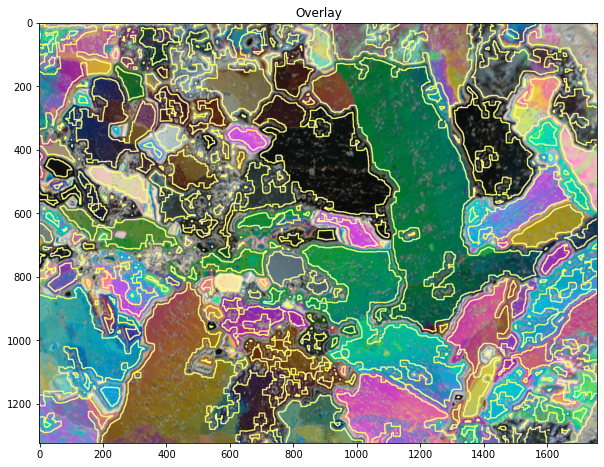

In [ ]:
# overlaying edges

plt.rcParams["lines.linewidth"] = 6
result_image = segmentation.mark_boundaries(loaded_image, inverted, outline_color=[3,3,3],mode='thick')
# outline color choices: https://developer.rhino3d.com/guides/rhinopython/python-rhinoscriptsyntax-color/
plt.figure(figsize=(10,10))
plt.title("Overlay")
plt.imshow(result_image)

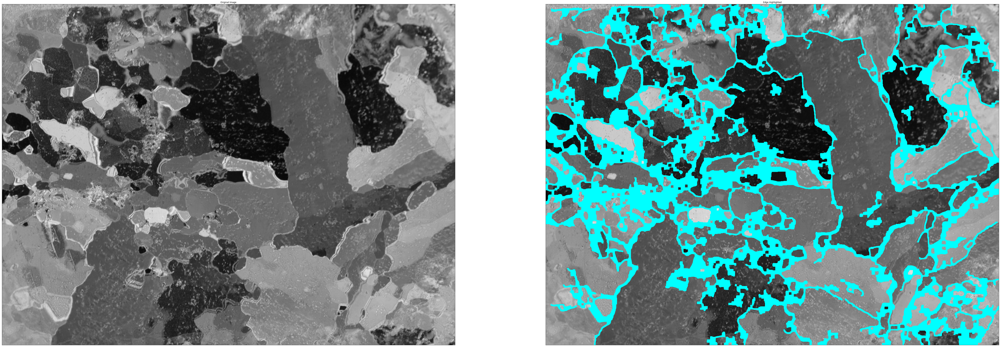

In [ ]:
# overlaying image with only borders on top of original

# converting image to grayscale
gray_image = cv2.cvtColor(loaded_image,cv2.COLOR_BGR2GRAY)

img = cv2.merge((gray_image,gray_image,gray_image))  # creat RGB image from grayscale
img2 = img.copy()
img2[erosion1 == 255] = [0, 255, 255]  # turn edges to blue

plt.figure(figsize=(100,100))
plt.subplot(121),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(img2)
plt.title('Edge Highlighted'), plt.xticks([]), plt.yticks([])

plt.show()


(array([70., 11.,  2.,  0.,  1.,  0.,  1.,  1.,  0.,  0.,  1.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([  1002,  21002,  41002,  61002,  81002, 101002, 121002, 141002,
        161002, 181002, 201002, 221002, 241002, 261002, 281002, 301002,
        321002, 341002, 361002, 381002, 401002, 421002, 441002, 461002,
        481002, 501002, 521002, 541002, 561002, 581002, 601002, 621002,
        641002, 661002, 681002, 701002, 721002, 741002, 761002, 781002,
        801002, 821002, 841002, 861002, 881002, 901002, 921002, 941002,
        961002]),
 <a list of 48 Patch objects>)

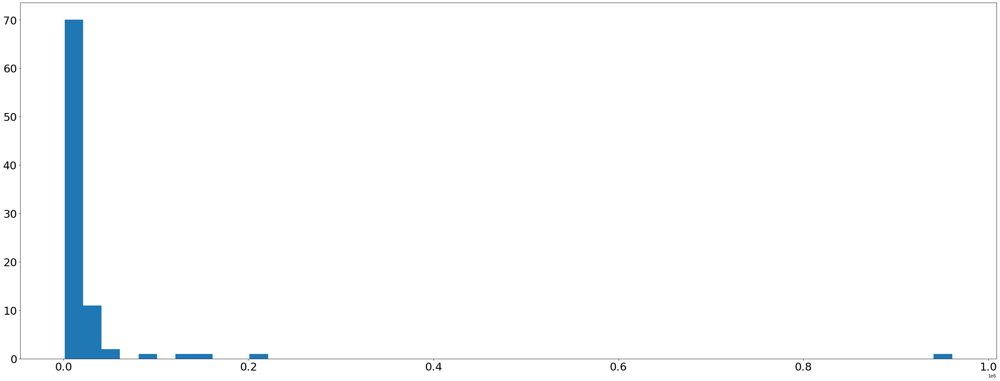

In [ ]:
# histogram

plt.figure(figsize=(40,15))
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
# w is width of each bin in histogram
w = 20000
plt.hist(areas, bins=np.arange(min(areas), max(areas) + w, w))

**Resources + Links**

Color Map options for plots:
* https://matplotlib.org/stable/api/cm_api.html#matplotlib.cm.get_cmap

We found "prism" and "tab20c" color maps look the best

Average pixel size from grayscale image:
* https://stackoverflow.com/questions/35586206/how-to-get-an-average-pixel-value-of-a-gray-scale-image-in-python-using-pil-nump

Denoising of colored images usign opencv
* https://www.geeksforgeeks.org/python-denoising-of-colored-images-using-opencv/

Floe size paper
* https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=6971211&tag=1
